# Repaso

In [21]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import skimage.morphology as morph

## Color

In [3]:
llanta = cv2.imread('llanta.jpg')

In [4]:
llanta_rgb = cv2.cvtColor(llanta, cv2.COLOR_BGR2RGB)
llanta_XYZ = cv2.cvtColor(llanta, cv2.COLOR_BGR2XYZ)
llanta_LAB = cv2.cvtColor(llanta, cv2.COLOR_BGR2LAB)
llanta_HSV = cv2.cvtColor(llanta, cv2.COLOR_BGR2HSV)
llanta_grey = cv2.cvtColor(llanta, cv2.COLOR_BGR2GRAY)

Text(0.5, 1.0, 'V')

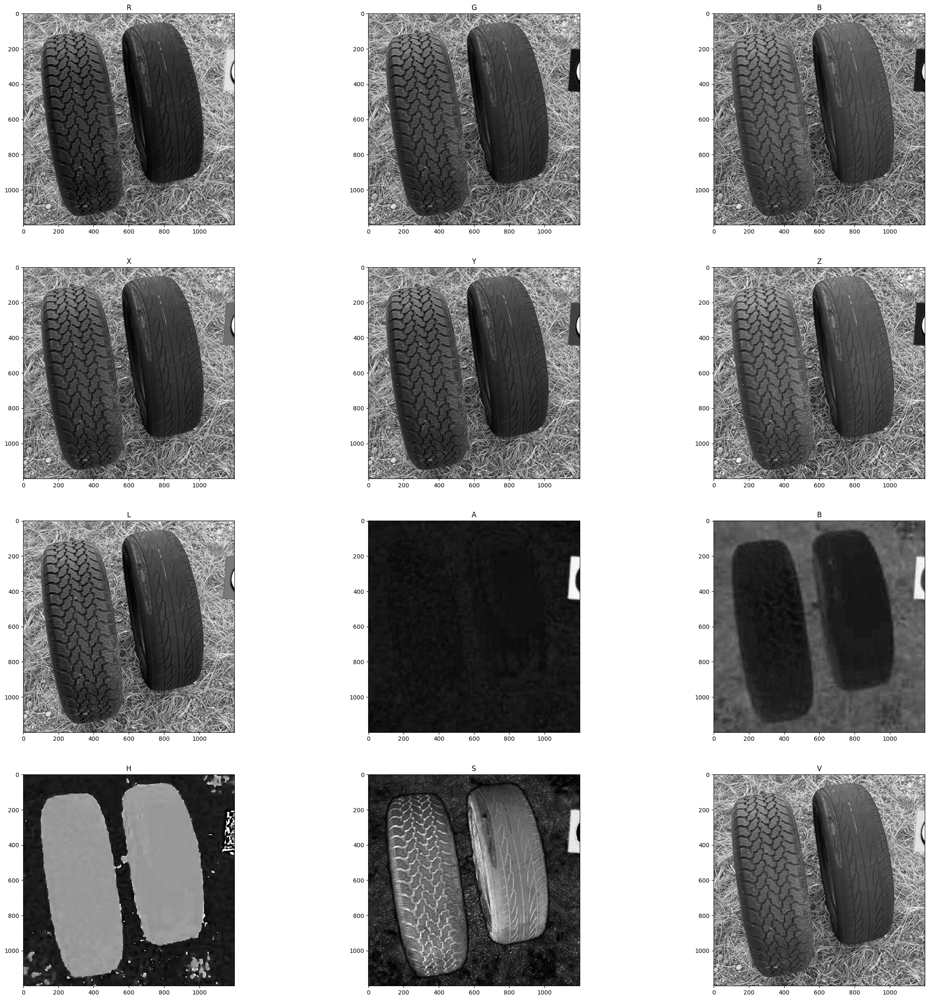

In [5]:
fig, axs = plt.subplots(4, 3, figsize=(30, 30))
# Rgb
axs[0, 0].imshow(llanta_rgb[:, :, 0], cmap='gray')
axs[0, 0].set_title('R')
axs[0, 1].imshow(llanta_rgb[:, :, 1], cmap='gray')
axs[0, 1].set_title('G')
axs[0, 2].imshow(llanta_rgb[:, :, 2], cmap='gray')
axs[0, 2].set_title('B')

# XYZ
axs[1, 0].imshow(llanta_XYZ[:, :, 0], cmap='gray')
axs[1, 0].set_title('X')
axs[1, 1].imshow(llanta_XYZ[:, :, 1], cmap='gray')
axs[1, 1].set_title('Y')
axs[1, 2].imshow(llanta_XYZ[:, :, 2], cmap='gray')
axs[1, 2].set_title('Z')

# LAB
axs[2, 0].imshow(llanta_LAB[:, :, 0], cmap='gray')
axs[2, 0].set_title('L')
axs[2, 1].imshow(llanta_LAB[:, :, 1], cmap='gray')
axs[2, 1].set_title('A')
axs[2, 2].imshow(llanta_LAB[:, :, 2], cmap='gray')
axs[2, 2].set_title('B')

# HSV
axs[3, 0].imshow(llanta_HSV[:, :, 0], cmap='gray')
axs[3, 0].set_title('H')
axs[3, 1].imshow(llanta_HSV[:, :, 1], cmap='gray')
axs[3, 1].set_title('S')
axs[3, 2].imshow(llanta_HSV[:, :, 2], cmap='gray')
axs[3, 2].set_title('V')

## Histogramas

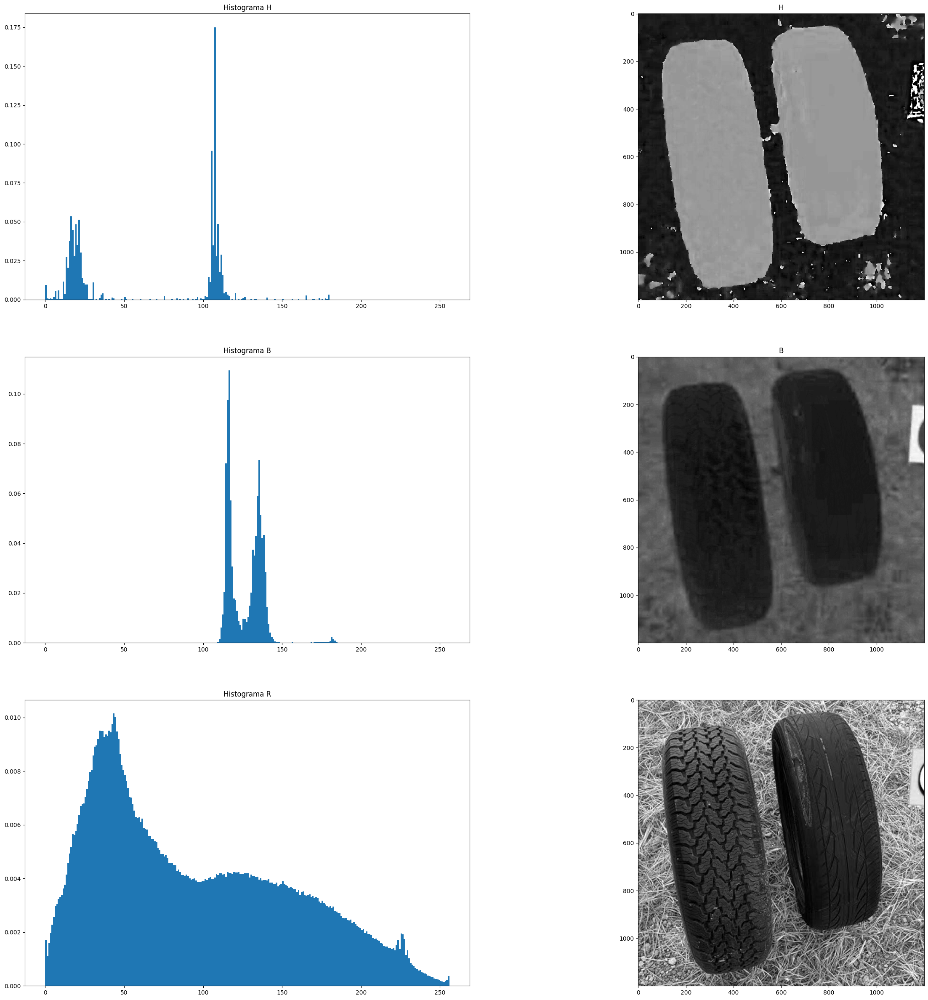

In [6]:
# Interesado en hacer histograma de 3 canales de color: H (HSV), B (LAB) y R (RGB)
fig, axs = plt.subplots(3, 2, figsize=(30, 30))

# H
axs[0, 0].hist(llanta_HSV[:, :, 0].ravel(), bins=256, range=[0, 256], density=True)
axs[0, 0].set_title('Histograma H')
axs[0, 1].imshow(llanta_HSV[:, :, 0], cmap='gray')
axs[0, 1].set_title('H')

# B
axs[1, 0].hist(llanta_LAB[:, :, 2].ravel(), bins=256, range=[0, 256], density=True)
axs[1, 0].set_title('Histograma B')
axs[1, 1].imshow(llanta_LAB[:, :, 2], cmap='gray')
axs[1, 1].set_title('B')

# R
axs[2, 0].hist(llanta_rgb[:, :, 0].ravel(), bins=256, range=[0, 256], density=True)
axs[2, 0].set_title('Histograma R')
axs[2, 1].imshow(llanta_rgb[:, :, 0], cmap='gray')

Selecciono el H

## Operaciones lineales

In [7]:
llanta_suma = cv2.add(llanta_HSV[:, :, 0], 30)
llanta_resta = cv2.subtract(llanta_HSV[:, :, 0], 30)
llanta_division = cv2.divide(llanta_HSV[:, :, 0], 2)
llanta_multiplicacion = cv2.multiply(llanta_HSV[:, :, 0], 2)
llanta_negativa = cv2.bitwise_not(llanta_HSV[:, :, 0])


Text(0.5, 1.0, 'Histograma Negativa')

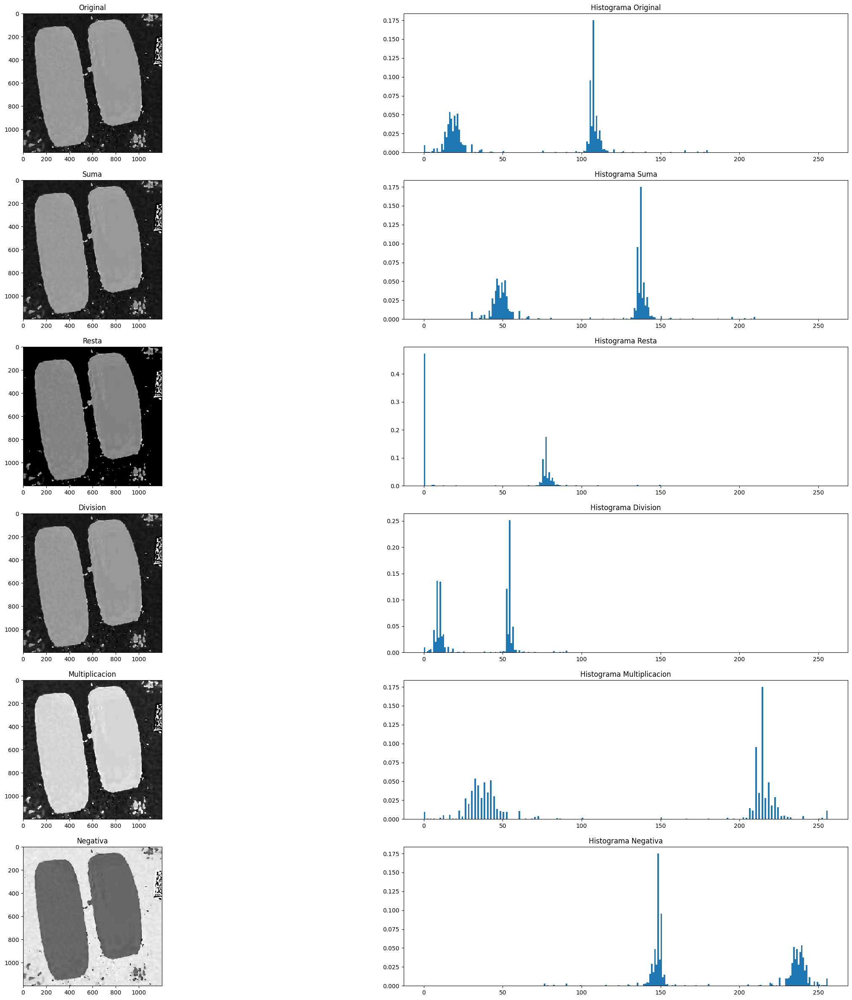

In [8]:
fig, axs = plt.subplots(6, 2, figsize=(30, 30))

# Original
axs[0, 0].imshow(llanta_HSV[:, :, 0], cmap='gray')
axs[0, 0].set_title('Original')
axs[0, 1].hist(llanta_HSV[:, :, 0].ravel(), bins=256, range=[0, 256], density=True)
axs[0, 1].set_title('Histograma Original')

# Suma
axs[1, 0].imshow(llanta_suma, cmap='gray')
axs[1, 0].set_title('Suma')
axs[1, 1].hist(llanta_suma.ravel(), bins=256, range=[0, 256], density=True)
axs[1, 1].set_title('Histograma Suma')

# Resta
axs[2, 0].imshow(llanta_resta, cmap='gray')
axs[2, 0].set_title('Resta')
axs[2, 1].hist(llanta_resta.ravel(), bins=256, range=[0, 256], density=True)
axs[2, 1].set_title('Histograma Resta')

# Division
axs[3, 0].imshow(llanta_division, cmap='gray')
axs[3, 0].set_title('Division')
axs[3, 1].hist(llanta_division.ravel(), bins=256, range=[0, 256], density=True)
axs[3, 1].set_title('Histograma Division')

# Multiplicacion
axs[4, 0].imshow(llanta_multiplicacion, cmap='gray')
axs[4, 0].set_title('Multiplicacion')
axs[4, 1].hist(llanta_multiplicacion.ravel(), bins=256, range=[0, 256], density=True)
axs[4, 1].set_title('Histograma Multiplicacion')

# Negativa
axs[5, 0].imshow(llanta_negativa, cmap='gray')
axs[5, 0].set_title('Negativa')
axs[5, 1].hist(llanta_negativa.ravel(), bins=256, range=[0, 256], density=True)
axs[5, 1].set_title('Histograma Negativa')

## Operaciones no lineales

In [9]:
#Definir la función para aplicar la transformación sobre la imagen RGB
def apply_f_on_rgb(img, f, args):

    #Crear una matriz de ceros del tamaño de la imagen de entrada
    res = np.zeros(img.shape, np.uint8)
    #Aplicar la transformación f sobre cada canal del espacio de color RGB
    res[:,:,0] = f(img[:,:,0], *args)
    res[:,:,1] = f(img[:,:,1], *args)
    res[:,:,2] = f(img[:,:,2], *args)

    return res

#Definir la función de transformación de la imagen (corrección gamma)
def gamma_correction(img, a, gamma):

    #Crear copia de la imagen tipo flotante dada la normalización
    img_copy = img.copy().astype(np.float32)/255.0
    #La función corrección gamma es de la forma ax^gamma, donde x es la imagen de entrada
    res_gamma = cv2.pow(img_copy,gamma)
    res = cv2.multiply(res_gamma, a)

    #Asegurar que la los datos queden entre 0 y 255 y sean uint8
    res[res<0] = 0
    res = res*255.0
    res[res>255] = 255

    res = res.astype(np.uint8)

    return res

#Definir la función expansión del histograma cuyo parámetro es una imagen
def histogram_expansion(img):

    #Crear matriz de ceros del tamaño de la imagen y tipo de dato flotante
    res = np.zeros([img.shape[0], img.shape[1]], dtype=np.float32)

    #Extraer el mínimo y el máximo del conjunto de datos
    m = float(np.min(img))
    M = float(np.max(img))
    #Aplicar la función de expansión(normalización) y asegurar datos uint8
    res = (img-m)*255.0/(M-m)
    res = res.astype(np.uint8)

    return res

#Definir la función ecualización del histograma cuyo parámetro es una imagen
def histogram_equalization(img):

    #Crear matriz de ceros del tamaño de la imagen y tipo de dato flotante
    res = np.zeros(img.shape, np.float32)
    #Crear un vector 1-D de la matriz de la imagen, es decir "aplanarla"
    img_raveled = img.ravel()
    #Generar el histograma normalizado de la imagen
    hist_norm = plt.hist(img_raveled, bins=255, range=(0.0, 255.0), density=True)
    #Limpiar la figura actual
    plt.clf()
    #hist_norm[0] es un vector de probabilidades. Añadir al vector, el valor [1 - sumatoria de sus datos]
    pdf = hist_norm[0]
    np.append(pdf, 1.0 - np.sum(pdf))
    #Dado que se añade un dato, se realiza la sumatoria de valores sobre todo el vector
    cdf = [np.sum(pdf[0:x]) for x in range(0,256)]
    #Hallar el valor mínimo y máximo de la imagen
    gmin = np.min(img)
    gmax = np.max(img)

    #Generar F(g) - Función de ecualización
    for g in range(0,256):
        res[img == g] = (gmax - gmin)*cdf[g] + gmin
    #Asegurar que los datos sean uint8 y esten en el rango correspondiente
    res[res<0] = 0
    res[res>255] = 255
    res = res.astype(np.uint8)
    return res

In [10]:
# Aplicar corrección gamma a la imagen H
img_gamma = gamma_correction(llanta_HSV[:,:,0], 1.0, 0.5)
# Aplicar expansión del histograma a la imagen H
img_expansion = histogram_expansion(llanta_HSV[:,:,0])
# Aplicar ecualización del histograma a la imagen H
img_equalization = histogram_equalization(llanta_HSV[:,:,0])

<Figure size 640x480 with 0 Axes>

Text(0.5, 1.0, 'Histograma Ecualización del histograma')

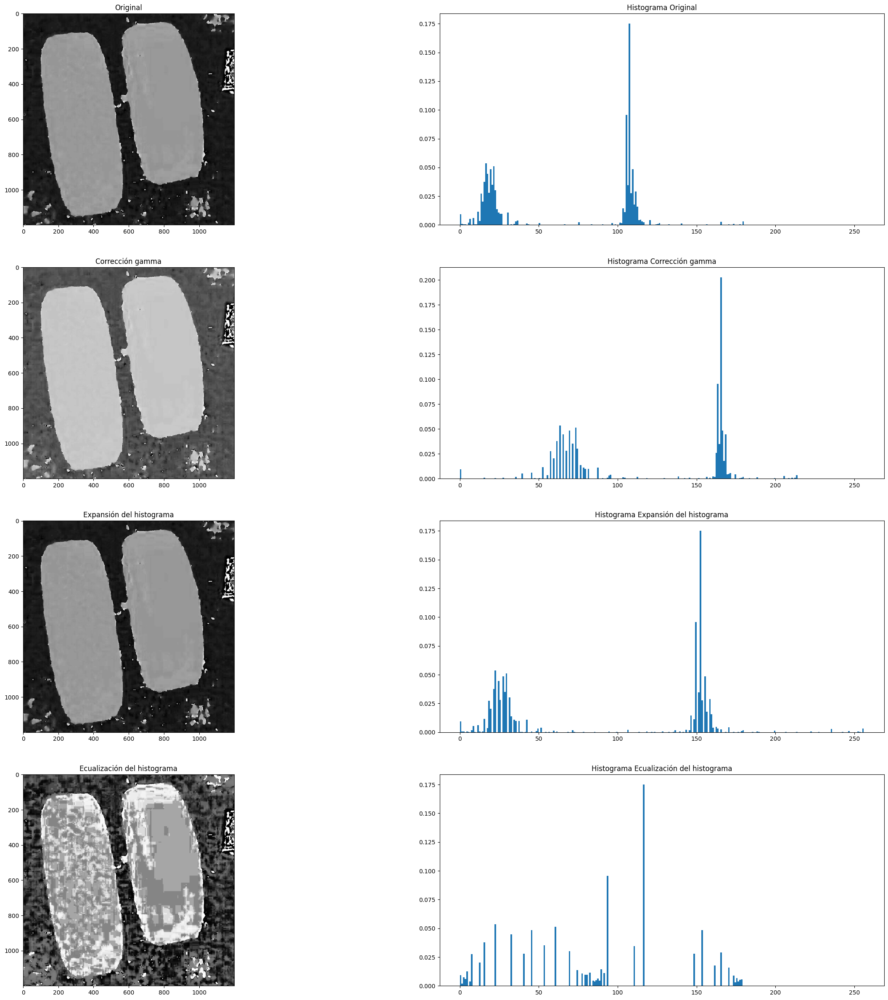

In [11]:
fig, axs = plt.subplots(4, 2, figsize=(30, 30))

# Original
axs[0, 0].imshow(llanta_HSV[:, :, 0], cmap='gray')
axs[0, 0].set_title('Original')
axs[0, 1].hist(llanta_HSV[:, :, 0].ravel(), bins=256, range=[0, 256], density=True)
axs[0, 1].set_title('Histograma Original')

# Corrección gamma
axs[1, 0].imshow(img_gamma, cmap='gray')
axs[1, 0].set_title('Corrección gamma')
axs[1,1].hist(img_gamma.ravel(), bins=256, range=[0, 256], density=True)
axs[1, 1].set_title('Histograma Corrección gamma')

# Expansión del histograma
axs[2, 0].imshow(img_expansion, cmap='gray')
axs[2,0].set_title('Expansión del histograma')
axs[2, 1].hist(img_expansion.ravel(), bins=256, range=[0, 256], density=True)
axs[2, 1].set_title('Histograma Expansión del histograma')

# Ecualización del histograma
axs[3, 0].imshow(img_equalization, cmap='gray')
axs[3, 0].set_title('Ecualización del histograma')
axs[3, 1].hist(img_equalization.ravel(), bins=256, range=[0, 256], density=True)
axs[3, 1].set_title('Histograma Ecualización del histograma')

## Ruido y filtros

### Ruido

In [12]:
def sp_noise(img, amount=0.05):
    """
    Agrega ruido de sal y pimienta a una imagen en escala de grises o en color.
    :param img: imagen de entrada (numpy array).
    :param porcentaje: porcentaje de píxeles que se convertirán en ruido de sal o pimienta (valor entre 0 y 1).
    :return: imagen con ruido de sal y pimienta (numpy array).
    """
    img_ruido = img.copy()
    # Agregar ruido a cada canal de color por separado
    if len(img.shape) == 2:
        black = 0
        white = 255
    else:
        black = np.array([0, 0, 0], dtype='uint8')
        white = np.array([255, 255, 255], dtype='uint8')
    probs = np.random.random(img_ruido.shape[:2])
    img_ruido[probs < (amount / 2)] = black
    img_ruido[probs > 1 - (amount / 2)] = white
    return img_ruido

def gaussian_noise(img, std = 0.02):
    #Las variables row, col y ch dependen de la imagen de entrada y sus componentes
    mean = 0
    row = img.shape[0]
    col = img.shape[1]
    ch =  img.shape[2] if len(img.shape) == 3 else 1
    #Definir la matriz de ceros noisy  del mismo tamaño que la imagen original
    noisy = np.zeros(img.shape, np.float64)
    #Generar una distribución normal a partir del comando de numpy
    gauss = np.random.normal(mean,std,(row,col,ch)) if ch > 1 else np.random.normal(mean,std,(row,col))
    gauss = gauss.reshape(row,col,ch)               if ch > 1 else gauss.reshape(row,col)
    #La imagen con ruido gaussiano es la suma de la imagen de entrada con la procesada
    noisy =  img + gauss
    #Ajustar los datos para que estén entre 0 y 255
    noisy[noisy<0] = 0
    noisy[noisy>255] = 255
    noisy = noisy.astype(np.uint8)
    return noisy

def poisson_noise(img):

    #Se aplica el comando de numpy random.poisson a la imagen de entrada
    # Por defecto es 1 la media
    # Ecuación de probabilidad P(x) = (e^(-lambda) * lambda^x) / x!
    noisy = np.random.poisson(img)
    #Los valores deben estar entre 0 y 255
    noisy[noisy<0] = 0
    noisy[noisy>255] = 255
    return noisy

def speckle_noise(img, dist_width):

    #Obtener los valores de row, col, ch de la imagen de entrada
    row = img.shape[0]
    col = img.shape[1]
    ch =  img.shape[2] if len(img.shape) == 3 else 1
    #Crear la copia de la imagen de entrada
    noisy = img.copy()
    #Modelar el ruido granular como una distribución uniforme
    uni_noise = np.random.uniform(-dist_width,dist_width,(row,col,ch)) if ch > 1 else np.random.uniform(-dist_width,dist_width,(row,col))

    #Se ajusta el tamaño de la imagen con ruido
    uni_noise = uni_noise.reshape(row,col,ch)   if ch > 1 else uni_noise.reshape(row,col)
    #Obtener la imagen ruidosa y ajustarla con datos entre 0 y 255
    noisy = img + img * uni_noise
    noisy[noisy<0] = 0
    noisy[noisy>255] = 255
    return noisy

In [13]:
ruido_sal_pimienta = sp_noise(llanta_rgb, 0.2)
ruido_gaussiano = gaussian_noise(llanta_rgb, 10)
ruido_poisson = poisson_noise(llanta_rgb)

Text(0.5, 1.0, 'Ruido poisson')

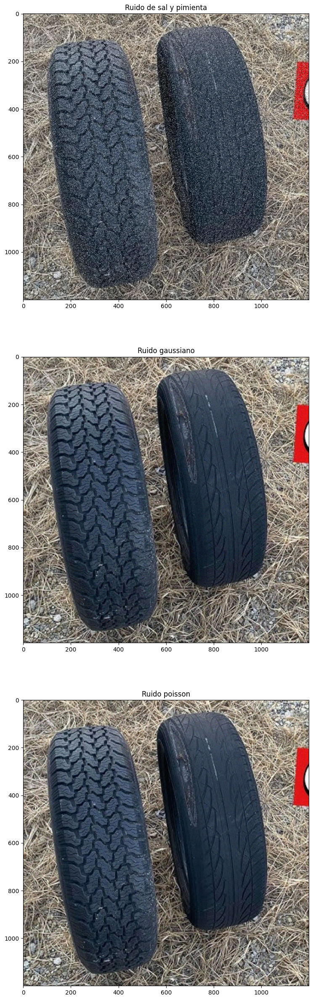

In [14]:
fig, axs = plt.subplots(3, 1, figsize=(30, 30))

# Ruido de sal y pimienta
axs[0].imshow(ruido_sal_pimienta)
axs[0].set_title('Ruido de sal y pimienta')

# Ruido gaussiano
axs[1].imshow(ruido_gaussiano)
axs[1].set_title('Ruido gaussiano')

# Ruido poisson
axs[2].imshow(ruido_poisson)
axs[2].set_title('Ruido poisson')

### Filtro

In [15]:
# Filtro gausiano
gaussian_filter = cv2.GaussianBlur(ruido_sal_pimienta, (5, 5), 2)
# Filtro de mediana
median_filter = cv2.medianBlur(ruido_sal_pimienta, 5)
# Filtro bilateral
bilateral_filter = cv2.bilateralFilter(ruido_sal_pimienta, 9, 75, 75)
# Filtro de promedio
average_filter = cv2.blur(ruido_sal_pimienta, (5, 5))

Text(0.5, 1.0, 'Filtro de promedio')

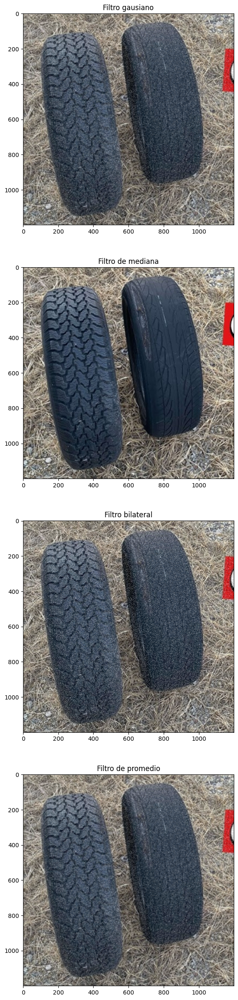

In [16]:
fig, axs = plt.subplots(4, 1, figsize=(30, 30))

# Filtro gausiano
axs[0].imshow(gaussian_filter)
axs[0].set_title('Filtro gausiano')

# Filtro de mediana
axs[1].imshow(median_filter)
axs[1].set_title('Filtro de mediana')

# Filtro bilateral
axs[2].imshow(bilateral_filter)
axs[2].set_title('Filtro bilateral')

# Filtro de promedio
axs[3].imshow(average_filter)
axs[3].set_title('Filtro de promedio')

## Segmentación + Morfologia

In [80]:
llanta_interes = llanta_HSV[:, :, 0].copy()

min_lim = 100
max_lim = 130

llanta_interes[llanta_interes < min_lim] = 0
llanta_interes[llanta_interes > max_lim] = 0
llanta_interes[(llanta_interes > min_lim) & (llanta_interes < max_lim)] = 255

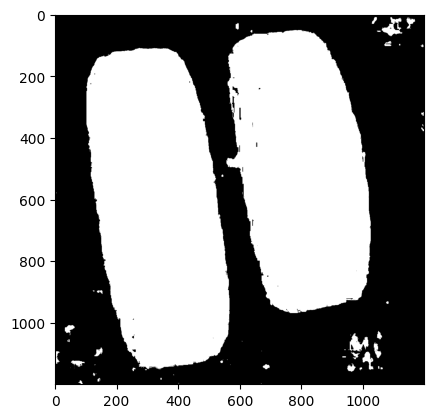

In [81]:
plt.imshow(llanta_interes, cmap='gray')

In [82]:
llanta_interes_morph = llanta_interes.copy()
llanta_interes_morph = morph.remove_small_holes(llanta_interes_morph, 300)

for i in range(2):
    llanta_interes_morph = morph.erosion(llanta_interes_morph, morph.disk(5))

llanta_interes_morph = morph.remove_small_objects(llanta_interes_morph, 300)

for i in range(2):
    llanta_interes_morph = morph.dilation(llanta_interes_morph, morph.disk(5))

C:\Users\Santiago\AppData\Local\Temp\ipykernel_13480\3985749207.py:2: UserWarning: Any labeled images will be returned as a boolean array. Did you mean to use a boolean array?
  llanta_interes_morph = morph.remove_small_holes(llanta_interes_morph, 300)


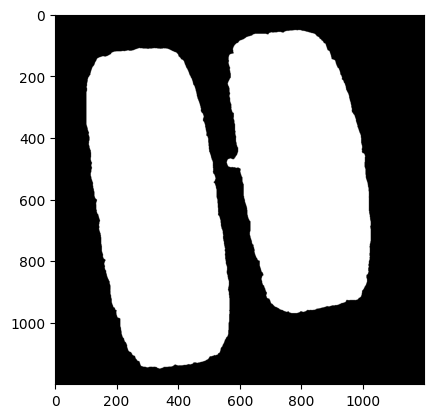

In [83]:
plt.imshow(llanta_interes_morph, cmap='gray')

## Imagen resultado

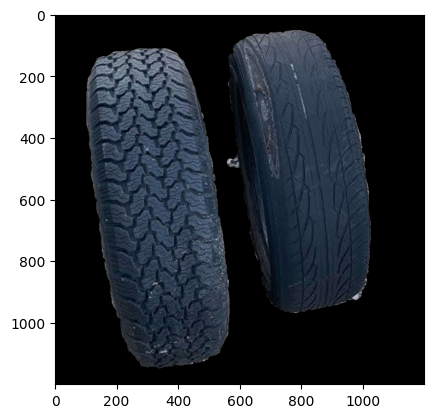

In [93]:
mascara = llanta_interes_morph.copy().astype(np.uint8)
mascara[mascara > 0] = 1

llanta_segmentada = llanta_rgb.copy()
for i in range(3):
    llanta_segmentada[:, :, i] = llanta_segmentada[:, :, i] * mascara
    

plt.imshow(llanta_segmentada)

## Extracción de bordes

In [98]:
def img_scale(img, value_range = [0,255]):
    return (value_range[1] - value_range[0])*(img - np.min(img))/(np.max(img)-np.min(img)) + value_range[0]

In [105]:
canny = cv2.Canny(llanta_segmentada, 120, 180)

sobelx = cv2.Sobel(llanta_segmentada.astype(np.float32), ddepth=-1, dx = 1, dy = 0, ksize = 3).astype(np.float32)
sobely = cv2.Sobel(llanta_segmentada.astype(np.float32), ddepth=-1, dx = 0, dy = 1, ksize = 3).astype(np.float32)
sobel = np.sqrt(np.power(sobelx,2)+np.power(sobely,2))
sobel = img_scale(sobel)

laplacian = cv2.Laplacian(llanta_segmentada, cv2.CV_64F)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Laplacian')

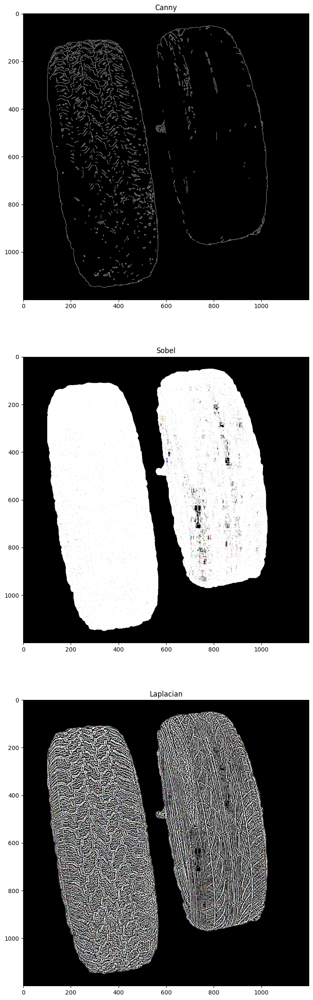

In [106]:
fig, axs = plt.subplots(3, 1, figsize=(30, 30))

# Canny
axs[0].imshow(canny, cmap='gray')
axs[0].set_title('Canny')

# Sobel
axs[1].imshow(sobel, cmap='gray')
axs[1].set_title('Sobel')

# Laplacian
axs[2].imshow(laplacian, cmap='gray')
axs[2].set_title('Laplacian')
